### Set up

In [1]:
# import and load modules
%reload_ext autoreload
%autoreload 2

import numpy as np; import pandas as pd; import math as math; import copy
from scipy.ndimage import gaussian_filter as gaussian_filter; import scipy.stats as stats
import statsmodels.api as sm; lowess = sm.nonparametric.lowess; from skimage import transform
from scipy import sparse

#mworks imports
#from mworksbehavior import mwkfiles; from mworksbehavior.imaging import intrinsic as ii; import mworksbehavior as mwb; import mworksbehavior.mwk_io

import matplotlib as mpl; import matplotlib.pyplot as plt; import matplotlib.gridspec as gridspec; from matplotlib import cm; from matplotlib.colors import ListedColormap, LinearSegmentedColormap
#from mpl_toolkits.axes_grid1 import make_axes_locatable #from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Circle; from matplotlib.patches import Rectangle

import os, sys; from glob import glob; from pathlib import Path; import pickle
import tifffile as tfl; from datetime import datetime

#local files and shorthand notations for assigning common functions to variable names
sys.path.append(Path('../src').resolve().as_posix()); 
import quietcell_select_fxns_all as qcsf
r_ = np.r_; a_ = np.asarray; n_ = np.newaxis

In [2]:
yr= '24'
animal_id = 'i5214'

if animal_id == 'i5214':
    dates = ['0710','0711','0712','0713','0714']
elif animal_id == 'i5309': 
    dates = ['0827','0828','0829','0830','0831']
elif animal_id == 'i5398':
    dates = ['0112','0113','0114','0115','0116'] 
    
dates_cell = ['pre']+dates+['post']
frs = ['stimFrs', 'blFrs']
rootdir = os.path.expanduser('~\\data-local\\'+animal_id)
file_path = os.path.join(rootdir,'bh-mc-reg')
mc_file_path = os.path.join(file_path,'mc')
reg_file_path = os.path.join(file_path,'reg')
file_path_suite2p = os.path.join(rootdir,'suite2p')

In [3]:
#get pre and post frame df/f
trained_ori_ind = 3
visResp_behavStim_pre = np.load(os.path.join(rootdir,'npys-pre\\visResp_behavStim_pre.npy'))
visResp_notStim_pre = np.load(os.path.join(rootdir,'npys-pre\\visResp_ctrl35um_pre.npy'))
i_notStimResponsive = np.where(visResp_notStim_pre[:,3] > 2.5)[0]
visResp_notStim_pre_filt = visResp_notStim_pre[i_notStimResponsive,:]

df_V_pre = np.load(os.path.join(rootdir,'npys-pre\\df_V_pre.npy'))
bl_V_pre = np.load(os.path.join(rootdir,'npys-pre\\avgPrestimV_pre.npy'))
dfof_V_pre = df_V_pre[trained_ori_ind,:,:]/bl_V_pre[trained_ori_ind,:,:]*100
dfof_V_pre_smooth = df_V_pre[trained_ori_ind,:,:]/gaussian_filter(bl_V_pre[trained_ori_ind,:,:],sigma=3)*100

visResp_behavStim_post = np.load(os.path.join(rootdir,'npys-post\\visResp_behavStim_post.npy'))
visResp_notStim_post = np.load(os.path.join(rootdir,'npys-pre\\visResp_ctrl35um_pre.npy'))
i_notStimResponsive = np.where(visResp_notStim_post[:,3] > 2.5)[0]
visResp_notStim_post_filt = visResp_notStim_post[i_notStimResponsive,:]

df_V_post = np.load(os.path.join(rootdir,'npys-post\\df_V_post.npy'))
bl_V_post = np.load(os.path.join(rootdir,'npys-post\\avgPrestimV_post.npy'))
dfof_V_post = df_V_post[trained_ori_ind,:,:]/bl_V_post[trained_ori_ind,:,:]*100
dfof_V_post_smooth = df_V_post[trained_ori_ind,:,:]/gaussian_filter(bl_V_post[trained_ori_ind,:,:],sigma=3)*100

C:\Users\Connor\AppData\Local\Temp\ipykernel_15500\3616191097.py:20: RuntimeWarning: invalid value encountered in divide
  dfof_V_post = df_V_post[trained_ori_ind,:,:]/bl_V_post[trained_ori_ind,:,:]*100


### Initializing necessary data structures

In [4]:
cell_masks = np.load(os.path.join(file_path,'cell_masks.npy')) # to make this go to the pre notebook and get the cell masks

#fluorescence dataframes
df_frs_reg = pd.DataFrame(index=frs, columns=dates) #registered framestacks [frs, sidelength, sidelength]
df_cells = pd.DataFrame(index=frs, columns=dates) # avg fluor for each cell during stim or BL
avg_fluor = pd.DataFrame(index=['fluor','dfof'], columns=dates) # frame averaged fluor 
isnan_test = pd.DataFrame(index=['all','any'],columns=dates)

#dfof dataframes
df_dfof_pix = pd.DataFrame(index=['dfof'], columns=dates) # frame dfof [sidelength, sidelength]
df_dfof_pix_split = pd.DataFrame(index=['dfof'], columns=dates) # copy for split versions

df_dfof_cells = pd.DataFrame(index=['dfof'], columns=dates_cell) # cell dfof [cells]
df_dfof_cellmap = pd.DataFrame(index=['cell_map'], columns=dates_cell) # map of cells (put cells in location on fov)

In [5]:
#load pre and post cells and cellmaps
pre_cell_map = np.load(os.path.join(rootdir,'npys-pre/dFoF_map_maskV_pre_lseg.npy'))[trained_ori_ind,:,:] #only use the 90° map for this anal
df_dfof_cellmap.at['cell_map','pre'] = pre_cell_map #only use the 90° map for this anal
post_cell_map = np.load(os.path.join(rootdir,'npys-post/dFoF_map_maskV_post_lseg.npy'))[trained_ori_ind,:,:] #only use the 90° map for this anal
df_dfof_cellmap.at['cell_map','post'] = post_cell_map #only use the 90° map for this anal

# df_dfof_cells.at['dfof','pre'] = np.load(os.path.join(rootdir,'npys-pre/dfoFV_cell_pre_lseg.npy'))[:,trained_ori_ind] #only use the 90° map for this anal
# df_dfof_cells.at['dfof','post'] = np.load(os.path.join(rootdir,'npys-post/dfoFV_cell_post_lseg.npy'))[:,trained_ori_ind] #only use the 90° map for this anal

df_dfof_cells.at['dfof','pre'] = np.load(os.path.join(rootdir,'npys-pre/dfoFV_cell_pre_lseg.npy')) #only use the 90° map for this anal
df_dfof_cells.at['dfof','post'] = np.load(os.path.join(rootdir,'npys-post/dfoFV_cell_post_lseg.npy')) #only use the 90° map for this anal

### functions

In [6]:
def _im_mask_and_avg(im,masks):
    '''applies a series of masks to an image stack and returns the average value of the
    image stack within each mask across all the frames in the stack; return shape of (nCell,nFrame)'''
    nFr, nRows, nCols = im.shape
    im_vect = np.reshape(im,(nFr,nRows*nCols))
    mask_vect = np.reshape(masks,(nRows*nCols,masks.shape[2]))
    mask_sizes = mask_vect.sum(axis=(0))

    mask_vect_sparse = sparse.csr_matrix(mask_vect)
    masked_im_sums = sparse.csr_matrix.dot(im_vect,mask_vect_sparse)
    masked_im_avgs = masked_im_sums/mask_sizes[n_,:] # shape (nFrame,nCell)

    return masked_im_avgs.T # shape (nCell,nFrame)

In [7]:
def generate_dfof_map_cell(cell_masks,dfoF_cell):

    nCell = cell_masks.shape[2]

    # generate map of avg dF/F for each cell mask
    nRows = cell_masks.shape[0]
    nCols = cell_masks.shape[1]
    dFoF_map_cell_masks = np.zeros((nCell,nRows,nCols))
    for iC in range(nCell):
        cell_map = dfoF_cell[iC] * cell_masks[:,:,iC]
        cell_map[cell_map==0] = np.nan
        dFoF_map_cell_masks[iC,:,:] = cell_map

    dFoF_map_mask = np.nanmin(dFoF_map_cell_masks,axis=0)
    
    return dFoF_map_cell_masks, dFoF_map_mask,cell_map

### get fluorescence (F) dataframes

In [8]:
#make dataframe of image stacks and dataframe of cell average Fluor
for row in df_frs_reg.index:
    for col in df_frs_reg.columns:
        for file in os.listdir(reg_file_path):
            if row+'-'+col in file:
                df_frs_reg.at[row, col] = tfl.imread(os.path.join(reg_file_path,file)) #frame stack here; frs registered to eachother
                masks_frs = _im_mask_and_avg(df_frs_reg.at[row, col],cell_masks) 
                df_cells.at[row, col] = masks_frs.mean(axis=1) #avg F for each cell during stim or baseline

### get dfof dataframes
@ Connor this is a little different than how we usually look at data, it's all the stim frames in one stack, not parsed based on trial. They are in chronological order though.

In [9]:
#dfof for fr and then for the cells
fr_store = [] # place to store frame count for each day
check_bl_zeros = []

for col in df_frs_reg.columns:
    
    #do the frame one *CONNOR, this is where you edit, 
    #make an array or dataframe that doesn't take the mean across all stim frames, but instead splice it in to first and second half, etc.
    # I recommend just using all the baseline frames for a given day for all analysis, and only segregating th
    

    split_ind = int(np.ceil(df_frs_reg.at['stimFrs', col].shape[0]/2)) #taking ceil so extra frame will be in the first half 
    stim_fr = df_frs_reg.at['stimFrs', col].mean(axis=0)
    bl_fr = df_frs_reg.at['blFrs', col].mean(axis=0)
    
    df_dfof_pix.at['dfof', col] = (stim_fr-bl_fr)/(gaussian_filter(bl_fr,sigma=3))*100

    # Adding version that is split 
    stim_fr_1 = df_frs_reg.at['stimFrs', col][:split_ind,:,:].mean(axis=0)
    stim_fr_2 = df_frs_reg.at['stimFrs', col][split_ind+1:,:,:].mean(axis=0)
    
    fr_store.append([len(df_frs_reg.at['stimFrs', col][:split_ind,:,:]),len(df_frs_reg.at['stimFrs', col][split_ind+1:,:,:])])

    df_dfof_pix_split.at['dfof', col] = [(stim_fr_1-bl_fr)/(gaussian_filter(bl_fr,sigma=3))*100, 
                                   (stim_fr_2-bl_fr)/(gaussian_filter(bl_fr,sigma=3))*100]

    
    # Calculating average fluorescence across a day
    fluor = df_frs_reg.at['stimFrs', col]
    print('shape for stored fluor data: %t', fluor.shape)
    
    avg_fluor.at['fluor',col] = fluor
    store_isnan_all = []
    store_isnan_any = []
    fluor_store = []
            
    avg_fluor.at['dfof',col] = (fluor.mean(axis=(1,2))-bl_fr.mean())/bl_fr.mean()*100
                
    #print('On %s there were %i frames with all nan' %(col,len(store_isnan_all)))
    #print('On %s there were %i frames with some nan' %(col,len(store_isnan_any)))
    
    #do the cell one
    stim_cell = df_cells.at['stimFrs', col]
    bl_cell = df_cells.at['blFrs', col]
    df_dfof_cells.at['dfof', col] = (stim_cell-bl_cell)/bl_cell*100

    #put the cells on a map
    dfof_for_cell_map = df_dfof_cells.at['dfof', col]
    dFoF_map_cell_masks,dFoF_map_mask,cell_map = generate_dfof_map_cell(cell_masks,dfof_for_cell_map)
    df_dfof_cellmap.at['cell_map', col] = dFoF_map_mask
    
    #Saving df_dfof_cells for later use
    

shape for stored fluor data: %t (250, 256, 256)


C:\Users\Connor\AppData\Local\Temp\ipykernel_16088\3370717781.py:14: RuntimeWarning: All-NaN slice encountered
  dFoF_map_mask = np.nanmin(dFoF_map_cell_masks,axis=0)


shape for stored fluor data: %t (470, 256, 256)
shape for stored fluor data: %t (640, 256, 256)
shape for stored fluor data: %t (310, 256, 256)
shape for stored fluor data: %t (470, 256, 256)


In [11]:
# Saving df_dfof_cells for later use
df_dfof_cells.to_pickle(os.path.join(rootdir,'npys-pre/df_dfof_cells.pkl'))

Zeros in baseline on day %s 0112
Zeros in baseline on day %s 0113
Zeros in baseline on day %s 0114
Zeros in baseline on day %s 0115
Zeros in baseline on day %s 0116


/var/folders/jz/44sr7v096p1d9w_7_z1267br0000gs/T/ipykernel_13390/852783867.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


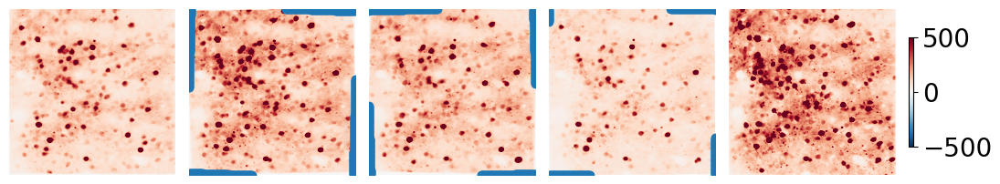

In [11]:
# Quantifying baseline data 
check_bl_zeros = []

fig, ax = plt.subplots(1, 5, figsize=(10,3))
cl=30
ax = ax.ravel()

for i,axes in enumerate(ax):
    
    date = dates[i]

    bl_fr = df_frs_reg.at['blFrs', date].mean(axis=0)
    check_bl_zeros.append(any(bl_fr.flatten() == 0)) # shows which days have 0
    axes.scatter(np.where(bl_fr == 0)[0],np.where(bl_fr == 0)[1]) # plots 0's in image
 
    if check_bl_zeros:
        print('Zeros in baseline on day %s', date)
    cl = 500 
    cmap = 'RdBu_r'
    
    
    im = axes.imshow(bl_fr,clim=(-cl,cl),cmap=cmap)
    axes.axis('off'); axes.set_xticks([]); axes.set_yticks([])
    plt.subplots_adjust(wspace=0.05, hspace=0.1)
    
    if i == 4:
        cbar_ax = fig.add_axes([1, 0.3, 0.005, 0.4])
        cbar_ax.tick_params(labelsize = 20)
        fig.colorbar(im,cax=cbar_ax)
        
plt.tight_layout()        
plt.show()

### dif frame maps

In [12]:
df_dfof_pix_extend = []
for i,col in enumerate(df_dfof_pix_split):


    df_dfof_pix_extend.append(df_dfof_pix_split.iloc[0,i][0])
    df_dfof_pix_extend.append(df_dfof_pix_split.iloc[0,i][1])

/var/folders/jz/44sr7v096p1d9w_7_z1267br0000gs/T/ipykernel_13390/2189970648.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


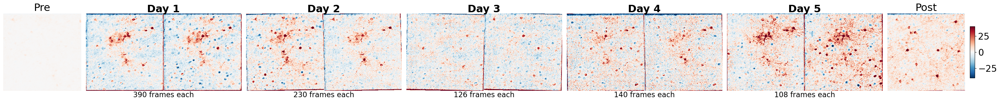

In [13]:
# Create figure
fig = plt.figure(figsize=(30, 4))  # Adjust figure size

# Define grid layout
gs = gridspec.GridSpec(1, 7, figure=fig, width_ratios=[1, 2, 2, 2, 2, 2, 1])

# First subplot (single)
ax1 = fig.add_subplot(gs[0])
ax1.imshow(dfof_V_pre_smooth,clim=(-cl,cl),cmap=cmap)
ax1.set_title("Pre",fontsize = 23)
ax1.axis('off'); ax1.set_xticks([]); ax1.set_yticks([])

# Middle 5 columns each containing two subplots side by side
index_first_half = [0,2,4,6,8]
middle_axes = []
cl = 40

for i in range(1, 6):  # Columns 1 to 5
    subgrid = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[i], wspace=0)  # 1 row, 2 columns
  
    ax_left = fig.add_subplot(subgrid[0])   # Left subplot
    ax_right = fig.add_subplot(subgrid[1])  # Right subplot
    
    ax_left.imshow(df_dfof_pix_extend[index_first_half[i-1]],clim=(-cl,cl),cmap=cmap)
    ax_right.imshow(df_dfof_pix_extend[index_first_half[i-1]+1],clim=(-cl,cl),cmap=cmap)

    ax_left.axis('off'); ax_left.set_xticks([]); ax_left.set_yticks([])
    ax_right.axis('off'); ax_right.set_xticks([]); ax_right.set_yticks([])
    
    fig.text(0.17 + 0.165 * (i - 1), 0.81, f"Day {i}", ha='center', fontsize=23, fontweight='bold')
    fig.text(0.17 + 0.165 * (i - 1), 0.15, f"{fr_store[i-1][0]} frames each", ha='center', fontsize=16)

    middle_axes.append((ax_left, ax_right))
    
# Last subplot (single)
ax7 = fig.add_subplot(gs[6])
im = ax7.imshow(dfof_V_post_smooth,clim=(-cl,cl),cmap=cmap)
ax7.set_title("Post",fontsize = 23)
ax7.axis('off'); ax7.set_xticks([]); ax7.set_yticks([])
cbar_ax = fig.add_axes([1, 0.3, 0.005, 0.4])
cbar_ax.tick_params(labelsize = 20)
fig.colorbar(im,cax=cbar_ax)

# Example styling
# for i, (ax_left, ax_right) in enumerate(axs_middle, start=1):
#     ax_left.set_title(f"Left {i}")
#     ax_right.set_title(f"Right {i}")

    
plt.tight_layout()
plt.show()

# Output save
name = '%s_split_across_days.png' %animal_id
fig.savefig(os.path.join(rootdir,name), bbox_inches='tight', dpi=400)


/var/folders/jz/44sr7v096p1d9w_7_z1267br0000gs/T/ipykernel_13390/36143189.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


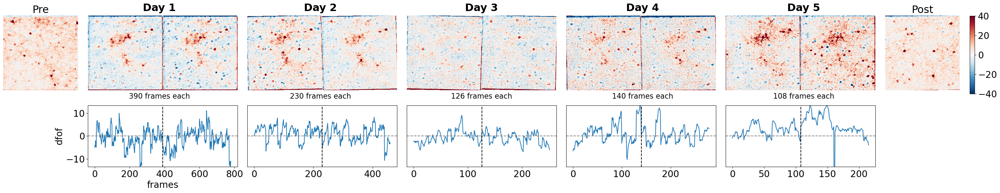

In [14]:
# Create figure
fig = plt.figure(figsize=(30, 6))  # Adjust figure size

# Define grid layout
gs = gridspec.GridSpec(2, 7, figure=fig, width_ratios=[1, 2, 2, 2, 2, 2, 1], height_ratios = [2,1])

# First subplot (single)
ax1 = fig.add_subplot(gs[0])
ax1.imshow(dfof_V_pre_smooth,clim=(-cl,cl),cmap=cmap)
ax1.set_title("Pre",fontsize = 23)
ax1.axis('off'); ax1.set_xticks([]); ax1.set_yticks([])

# Middle 5 columns each containing two subplots side by side
index_first_half = [0,2,4,6,8]
middle_axes = []
cl = 40

for i in range(1, 6):  # Columns 1 to 5
    subgrid = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[i], wspace=0, hspace =0)  # 1 row, 2 columns
  
    ax_left = fig.add_subplot(subgrid[0])   # Left subplot
    ax_right = fig.add_subplot(subgrid[1])  # Right subplot
    
    ax_left.imshow(df_dfof_pix_extend[index_first_half[i-1]],clim=(-cl,cl),cmap=cmap)
    ax_right.imshow(df_dfof_pix_extend[index_first_half[i-1]+1],clim=(-cl,cl),cmap=cmap)

    ax_left.axis('off'); ax_left.set_xticks([]); ax_left.set_yticks([])
    ax_right.axis('off'); ax_right.set_xticks([]); ax_right.set_yticks([])
    
    fig.text(0.17 + 0.165 * (i - 1), 0.85, f"Day {i}", ha='center', fontsize=23, fontweight='bold')
    fig.text(0.17 + 0.165 * (i - 1), 0.40, f"{fr_store[i-1][0]} frames each", ha='center', fontsize=16)

    middle_axes.append((ax_left, ax_right))
    
# Last subplot (single)
ax7 = fig.add_subplot(gs[6])
im = ax7.imshow(dfof_V_post_smooth,clim=(-cl,cl),cmap=cmap)
ax7.set_title("Post",fontsize = 23)
ax7.axis('off'); ax7.set_xticks([]); ax7.set_yticks([])
cbar_ax = fig.add_axes([1, 0.425, 0.005, 0.4])
cbar_ax.tick_params(labelsize = 20)
fig.colorbar(im,cax=cbar_ax)
    
# First subplot second row  (single)
ax8 = fig.add_subplot(gs[7])
ax8.axis('off'); ax1.set_xticks([]); ax1.set_yticks([])

row_shift = 7
# Middle 5 columns each containing two subplots side by side
for i in range(1+row_shift, 6+row_shift):  # Columns 1 to 5
    subgrid = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[i], wspace=1, hspace =0)  # 1 row, 2 columns

    ax = fig.add_subplot(gs[i])
    ax.plot(avg_fluor.at['dfof',dates[i-1-row_shift]])    
    ax.axvline(fr_store[i-1-row_shift][0],c='black',linestyle='--')
    ax.axhline([0],c='gray',linestyle='--')
    ax.axis("off")
    plt.rcParams.update({'font.size': 20})
    
# Last subplot (single)
ax14 = fig.add_subplot(gs[13])
ax14.axis('off'); ax14.set_xticks([]); ax14.set_yticks([])    
plt.tight_layout()

# Finding max value of dfof across all days to set y range
data = []
for date in dates: 
    data.append(avg_fluor.loc['dfof',date])
    
data = np.concatenate(data)
data = np.sort(data)
min_range = data[3]
max_range = data[-3]

# Adding axes back in manually to keep spacing! 
for i in range(1+row_shift, 6+row_shift):  # Columns 1 to 5
    ax = fig.add_subplot(gs[i])
    ax.axis("on")  # Re-enable axis visibility
    ax.plot(avg_fluor.at['dfof',dates[i-1-row_shift]])    
    ax.axvline(fr_store[i-1-row_shift][0],c='black',linestyle='--')
    ax.axhline([0],c='gray',linestyle='--')
    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)
    ax.spines["left"].set_visible(True)
    ax.spines["bottom"].set_visible(True)
    ax.set_ylim([-max_range, max_range])

    if i == 1+row_shift:
        ax.set_xlabel("frames")
        ax.set_ylabel("dfof")
        
    if i > 1+row_shift:
        ax.set_yticks([])
        
   
    # Check
    # if i == 5+row_shift:
    #     ax.set_yticks([min_range, max_range])

plt.show()


# Output save
name = '%s_split_across_days_double.png' %animal_id
fig.savefig(os.path.join(rootdir,name), bbox_inches='tight', dpi=400)


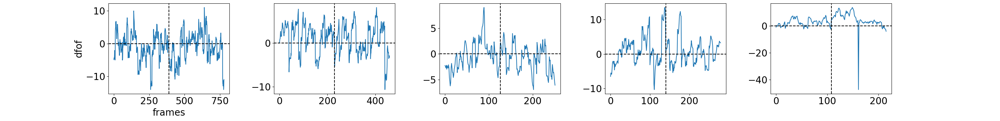

In [15]:
# Creating line plots of stimulated cells dfof each day in stim frames

# Create figure
fig = plt.figure(figsize=(30, 4))  # Adjust figure size

# Define grid layout
gs = gridspec.GridSpec(1, 7, figure=fig, width_ratios=[1, 2, 2, 2, 2, 2, 1])

# First subplot (single)
ax1 = fig.add_subplot(gs[0])
ax1.axis('off'); ax1.set_xticks([]); ax1.set_yticks([])

# Middle 5 columns each containing two subplots side by side
index_first_half = [0,2,4,6,8]
middle_axes = []
cl = 40
for i in range(1, 6):  # Columns 1 to 5
    
    ax_mid = fig.add_subplot(gs[i])
    ax_mid.plot(avg_fluor.at['dfof',dates[i-1]])    
    ax_mid.axvline(fr_store[i-1][0],c='black',linestyle='--')
    ax_mid.axhline([0],c='black',linestyle='--')

    plt.rcParams.update({'font.size': 20})

    if i == 1:
        ax_mid.set_xlabel("frames")
        ax_mid.set_ylabel("dfof")
    
# Last subplot (single)
ax7 = fig.add_subplot(gs[6])
ax7.axis('off'); ax7.set_xticks([]); ax7.set_yticks([])

plt.tight_layout()
plt.show()

# Output save
name = '%s_dfof_across_days.png' %animal_id
fig.savefig(os.path.join(rootdir,name), bbox_inches='tight', dpi=400)

In [16]:
# mean1 = np.nanmean(avg_fluor.at['dfof',dates[0]],axis=1)
# out = np.isinf(mean1)
# vals = np.where(out)

# #Plotting where inf in first mean
# plt.scatter(np.where(out==True)[0],np.where(out==True)[1])
# plt.title("Inf Values in Matrix Before Averaging Over the Final Dim")

# print(mean1.shape)
# print("Values of nanmean across dim1:\n")
# print(mean1)
# print(mean2.shape)
# print("nValues of nanmean across final average:\n")
# mean2 = np.nanmean(mean1,axis=1)
# print(mean2)


/var/folders/jz/44sr7v096p1d9w_7_z1267br0000gs/T/ipykernel_13390/3724525581.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


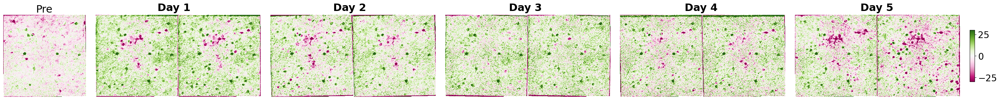

In [17]:
# Create figure
fig = plt.figure(figsize=(30, 4))  # Adjust figure size

# Define grid layout
gs = gridspec.GridSpec(1, 6, figure=fig, width_ratios=[1, 2, 2, 2, 2, 2])
cl = 30

# First subplot (single)
ax1 = fig.add_subplot(gs[0])
ax1.imshow(dfof_V_post-dfof_V_pre,clim=(-cl,cl),cmap='PiYG')
ax1.set_title("Pre",fontsize = 23)
ax1.axis('off'); ax1.set_xticks([]); ax1.set_yticks([])

# Middle 5 columns each containing two subplots side by side
index_first_half = [0,2,4,6,8]
middle_axes = []

for i in range(1, 6):  # Columns 1 to 5
    subgrid = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[i], wspace=0)  # 1 row, 2 columns
  
    ax_left = fig.add_subplot(subgrid[0])   # Left subplot
    ax_right = fig.add_subplot(subgrid[1])  # Right subplot
    
    ax_left.imshow(dfof_V_post-df_dfof_pix_extend[index_first_half[i-1]],clim=(-cl,cl),cmap='PiYG')
    ax_right.imshow(dfof_V_post-df_dfof_pix_extend[index_first_half[i-1]+1],clim=(-cl,cl),cmap='PiYG')

    ax_left.axis('off'); ax_left.set_xticks([]); ax_left.set_yticks([])
    ax_right.axis('off'); ax_right.set_xticks([]); ax_right.set_yticks([])
    
    fig.text(0.185 + 0.18 * (i - 1), 0.85, f"Day {i}", ha='center', fontsize=23, fontweight='bold')
    
    if i == 5:
        im = ax_right.imshow(dfof_V_post-df_dfof_pix_extend[index_first_half[i-1]+1],clim=(-cl,cl),cmap='PiYG')
        cbar_ax = fig.add_axes([1, 0.3, 0.005, 0.4])
        cbar_ax.tick_params(labelsize = 20)
        fig.colorbar(im,cax=cbar_ax)

# Example styling
# for i, (ax_left, ax_right) in enumerate(axs_middle, start=1):
#     ax_left.set_title(f"Left {i}")
#     ax_right.set_title(f"Right {i}")
    
plt.tight_layout()
plt.show()

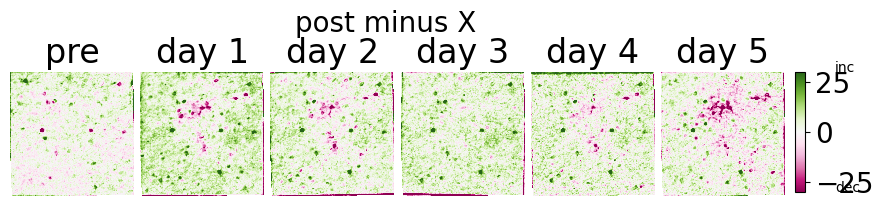

In [18]:
fig, ax = plt.subplots(1, 6, figsize=(10,3))
cl=30
ax = ax.ravel()
for i,axes in enumerate(ax):
    cl=30
    if i > 0:
        axes.imshow(dfof_V_post-df_dfof_pix.iloc[0, i-1],clim=(-cl,cl),cmap='PiYG')
        axes.set_title('day '+str(i))
    else:
        im = axes.imshow(dfof_V_pre-dfof_V_post,clim=(-cl,cl),cmap='PiYG')
        axes.set_title('pre')
        cbar_ax = fig.add_axes([0.91, 0.3, 0.01, 0.4])
        #cbar = fig.colorbar(cm.ScalarMappable(cmap='PiYG'), ax=axes, ticks=[0, 1], shrink=0.95, pad=0.02)
        fig.colorbar(im,cax=cbar_ax)
    axes.axis('off'); axes.set_xticks([]); axes.set_yticks([])
plt.text(-50,50,'post minus X',fontsize=20)
plt.text(4,30,'inc',fontsize=10)
plt.text(4,-30,'dec',fontsize=10)
plt.subplots_adjust(wspace=0.05, hspace=0.1)
#plt.savefig(os.path.join(rootdir,'postminusX.png'), bbox_inches='tight', dpi=400)

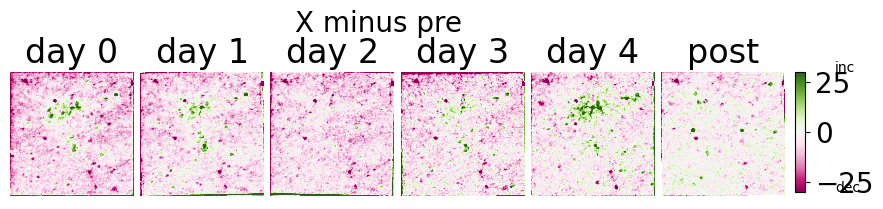

In [19]:
fig, ax = plt.subplots(1, 6, figsize=(10,3))
cl=30
ax = ax.ravel()

for i,axes in enumerate(ax):
    cl=30
    
    if i < 5:
        axes.imshow(df_dfof_pix.iloc[0, i]-dfof_V_pre,clim=(-cl,cl),cmap='PiYG')
        axes.set_title('day '+str(i))
    else:
        im = axes.imshow(dfof_V_post-dfof_V_pre,clim=(-cl,cl),cmap='PiYG')
        axes.set_title('post')
        cbar_ax = fig.add_axes([0.91, 0.3, 0.01, 0.4])
        fig.colorbar(im,cax=cbar_ax)
        
    axes.axis('off'); axes.set_xticks([]); axes.set_yticks([])
        
plt.text(-50,50,'X minus pre',fontsize=20)
plt.text(4,30,'inc',fontsize=10)
plt.text(4,-30,'dec',fontsize=10)
plt.subplots_adjust(wspace=0.05, hspace=0.1)
    #plt.savefig(os.path.join(rootdir,'xminuspre.png'), bbox_inches='tight', dpi=400)

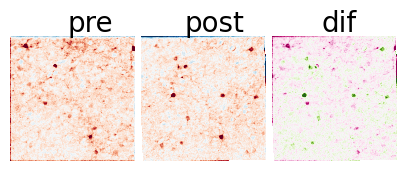

In [219]:
fig, ax = plt.subplots(1,3,figsize=(5,2))
cl=40;ax = ax.ravel()
ax[0].imshow(dfof_V_pre,clim=(-cl,cl),cmap='RdBu_r')
ax[1].imshow(dfof_V_post,clim=(-cl,cl),cmap='RdBu_r')
ax[2].imshow(dfof_V_post-dfof_V_pre,clim=(-cl,cl),cmap='PiYG')
ax[0].axis('off');ax[1].axis('off');ax[2].axis('off')
plt.text(-420,-10,'pre');plt.text(-180,-10,'post');plt.text(100,-10,'dif')
plt.subplots_adjust(wspace=0.05, hspace=0.1)

### dif cell maps

In [220]:
df_delta_dfof_bh_map = pd.DataFrame(index=['cell_map'], columns=dates) # change from day 1 of behavior
df_delta_dfof_bh = pd.DataFrame(index=['dfof'], columns=dates) # change from day 1 of behavior

for col in df_delta_dfof_bh_map.columns:
    df_delta_dfof_bh_map.at['cell_map',col] = df_dfof_cellmap.at['cell_map',col]-df_dfof_cellmap.at['cell_map',dates[0]]
    df_delta_dfof_bh.at['dfof',col] = df_dfof_cells.at['dfof',col]-df_dfof_cells.at['dfof',dates[0]]


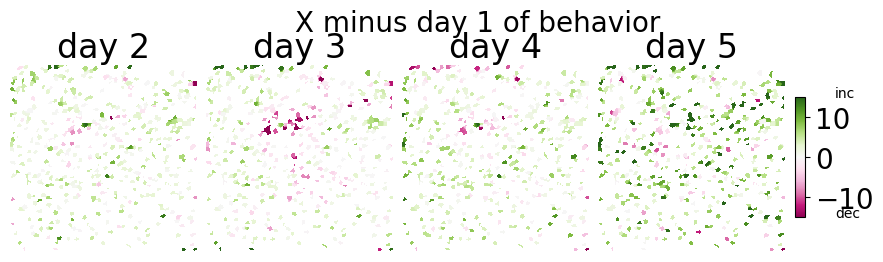

In [221]:
fig, ax = plt.subplots(1, 4, figsize=(10,3))
cl=15
ax = ax.ravel()
for i,axes in enumerate(ax):
    im = axes.imshow(df_delta_dfof_bh_map.iloc[0,i+1],clim=(-cl,cl),cmap='PiYG')
    axes.set_title('day '+str(i+2))
    if i == 1:
        cbar_ax = fig.add_axes([0.91, 0.3, 0.01, 0.4])
        fig.colorbar(im,cax=cbar_ax)
    axes.axis('off'); axes.set_xticks([]); axes.set_yticks([])
plt.text(-50,cl*2.1,'X minus day 1 of behavior',fontsize=20)
plt.text(4,cl,'inc',fontsize=10)
plt.text(4,-cl,'dec',fontsize=10)
plt.subplots_adjust(wspace=0.05, hspace=0.1)
#plt.savefig(os.path.join(rootdir,'xminuspre.png'), bbox_inches='tight', dpi=400)

In [222]:
df_delta_dfof_bh_map.iloc[0,1][0][0]

nan

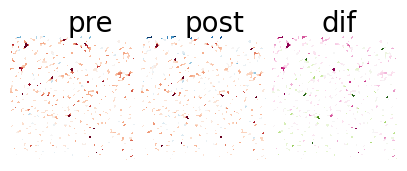

In [223]:
post_pre_dif_map = df_dfof_cellmap.at['cell_map','post']-df_dfof_cellmap.at['cell_map','pre']

fig, ax = plt.subplots(1,3,figsize=(5,2));cl=20;ax = ax.ravel()
ax[0].imshow(df_dfof_cellmap.at['cell_map','pre'],clim=(-cl,cl),cmap='RdBu_r')
ax[1].imshow(df_dfof_cellmap.at['cell_map','post'],clim=(-cl,cl),cmap='RdBu_r')
ax[2].imshow(post_pre_dif_map,clim=(-cl,cl),cmap='PiYG')
plt.text(-420,-10,'pre',size=20);plt.text(-180,-10,'post',size=20);plt.text(100,-10,'dif',size=20)
ax[0].axis('off');ax[1].axis('off');ax[2].axis('off')
plt.subplots_adjust(wspace=0.05, hspace=0.1)

### circle the changers (can also use the "pattern_coords" array to circle the stim cells)

In [629]:
cell_coords = []
for iC in range(cell_masks.shape[2]):
    ys,xs = np.where(cell_masks[:,:,iC]>0)
    coord = [np.average(xs),np.average(ys)]
    cell_coords.append(coord)

In [631]:
exp_params = pickle.load(open(os.path.join(file_path_suite2p,'expt_params.pkl'),'rb')); #print('\npre_params)

In [632]:
with qcsf.analysis_2p_general(file_path=file_path_suite2p,expt_params=exp_params) as q2pg:
    cell_coords,pattern_coords,conversion_factor = q2pg.calculate_cell_pattern_coords(rootdir,cell_masks,csv_pattern_filename='quiet.csv')
    stim_iC,nostim_iC,all_iC = q2pg.label_stimulated_cells(cell_coords,pattern_coords,radius_microns=10) #0.5 pix/um 2x; 0.616 pix/um 2.5x

# np.save(os.path.join(rootdir,'npys-pre/stim_iC.npy'),stim_iC)
# np.save(os.path.join(rootdir,'npys-pre/nostim_iC.npy'),nostim_iC)
    
print("how many stimulated cells?", len(stim_iC))
print("how many stimulated spots?", len(pattern_coords))

zoom = 2.5. Finding cell IDs within direct stimulation radius... Stimulated cell IDs found.
how many stimulated cells? 21
how many stimulated spots? 15


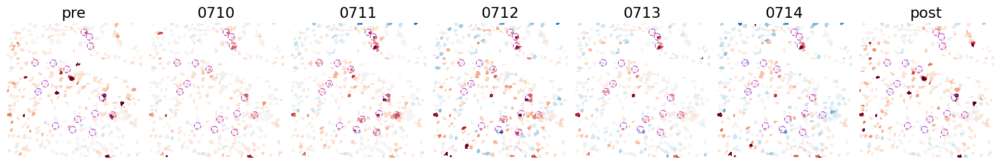

In [633]:
shift_x = 0
shift_y = 0
fig, ax = plt.subplots(1, 7, figsize=(20,6)); cl=40
for i,axes in enumerate(ax):
    axes.imshow(df_dfof_cellmap.iloc[0,i],clim=(-cl,cl),cmap='RdBu_r')
    axes.axis('off'); axes.set_xticks([]); axes.set_yticks([])
    for coords in pattern_coords:
        axes.add_patch( Circle((coords[0]+shift_x,coords[1]+shift_y),radius=10*conversion_factor,fill=False,ec='mediumorchid',ls='--',lw=1,alpha=1) )
    axes.set_title(df_dfof_cellmap.columns[i])
plt.subplots_adjust(wspace=0.05, hspace=0.1)
#plt.savefig(os.path.join(rootdir,'top_changers_circled.png'), bbox_inches='tight', dpi=400)

### Cell-based analysis

In [578]:
dfof_cells_all

,pre,Day 1,Day 2,Day 3,Day 4,Day 5,post
trained,"[[2.53089396370578, -0.28136687437121993, -4.0...","[19.242301304686755, 8.083859617361327, 23.979...","[11.505560748456421, 8.853405651693546, 19.563...","[2.0093282374702364, 1.7555947464117543, 0.613...","[9.164670544455843, 11.40987607726491, 31.1150...","[14.362973058073536, 8.345555389652885, 58.842...","[[-2.4337391709632374, 1.2054430391974864, -2...."
untrained,"[[0.46517674640961393, -6.517109284461757, -0....","[4.354824876309391, -9.068721380467773, -11.18...","[10.172309877161164, -4.8928740427562945, -6.5...","[0.8394947050903495, -7.019663477465696, -6.21...","[8.478620124918088, -10.862325273140282, -6.97...","[-2.630421668625001, -6.745798063142093, 2.476...","[[-2.892478326132425, -0.43085983160855634, 2...."


In [10]:
# Loading in all df_dfof_cells 
animals = ['i5214','i5309','i5398']
days = np.array(list(range(1,6)))
days = np.char.add("Day ",days.astype(str))
behavior_days = days.tolist()
days = ['pre'] + behavior_days + ['post']

dfof_cells_all = pd.DataFrame(index=['trained','untrained'], columns=days) # cell dfof [cells]

for i, animal in enumerate(animals): 
    data_dir = '/Users/phillipscm/data-local/' + animal + '/npys-pre/'
    # os.path.expanduser('~/data-local/'+animal+'/npys_pre/df_dfof_cells.pkl')
    df = pd.read_pickle(data_dir +'/df_dfof_cells.pkl')
    df.columns = days
    
    stim_iC = np.load(data_dir +'/stim_iC.npy')  
    nostim_iC = np.load(data_dir +'/nostim_iC.npy')
    
    for col in dfof_cells_all.columns:
        
        if i == 0:
            if col == 'pre' or col == 'post':
                dfof_cells_all.at['trained',col] = df[col][0][stim_iC,:]
                dfof_cells_all.at['untrained',col] = df[col][0][nostim_iC,:]
            else: 
                dfof_cells_all.at['trained',col] = df[col][0][stim_iC]
                dfof_cells_all.at['untrained',col] = df[col][0][nostim_iC]
        else:
            if col == 'pre' or col == 'post':
                dfof_cells_all.at['trained',col] = np.concatenate((dfof_cells_all.at['trained',col], df[col][0][stim_iC,:]),axis=0)
                dfof_cells_all.at['untrained',col] = np.concatenate((dfof_cells_all.at['untrained',col], df[col][0][nostim_iC,:]),axis=0)
            else: 
                dfof_cells_all.at['trained',col] = np.concatenate((dfof_cells_all.at['trained',col], df[col][0][stim_iC]),axis=0)
                dfof_cells_all.at['untrained',col] = np.concatenate((dfof_cells_all.at['untrained',col], df[col][0][nostim_iC]),axis=0)


FileNotFoundError: [Errno 2] No such file or directory: '/Users/phillipscm/data-local/i5214/npys-pre//df_dfof_cells.pkl'

### Behavior cell analysis 

In [9]:
# Goal: plot line plot of the dfof all trained and untrained cells over the 5 days 

index_df = pd.DataFrame(index=['trained','untrained'],columns=['high','low','across_days','high_dict','low_dict','high_num','low_num'])

# Percent change b/t first and last day threshold
p_threshold = 0.3

for i,cell_class in enumerate(index_df.index):
    
    # Grab create array of stim_cell x day
    data = []
    for day in behavior_days: 
        data.append(dfof_cells_all.at[cell_class,day])

    # Finding the indices of the cells with the greatest difference between the first and the last day
    diff = data[-1:]-data[0]
    diff = diff[0]
    
    # find num of cells defined by top and bottom 10% 
    n = int(np.ceil(len(diff)*p_threshold))

    # Sorting array by index not by value 
    sorted_index_array = np.argsort(diff)
    
    # Finding responders (most postive and negative change)
    index_df.at[cell_class,'high'] = sorted_index_array[-n:]
    index_df.at[cell_class,'low'] = sorted_index_array[1:n]        
    index_df.at[cell_class,'across_days'] = np.array(data)
    

Text(0.5, 0.98, 'Cells Filtered By Top 30% Change During Behavior')

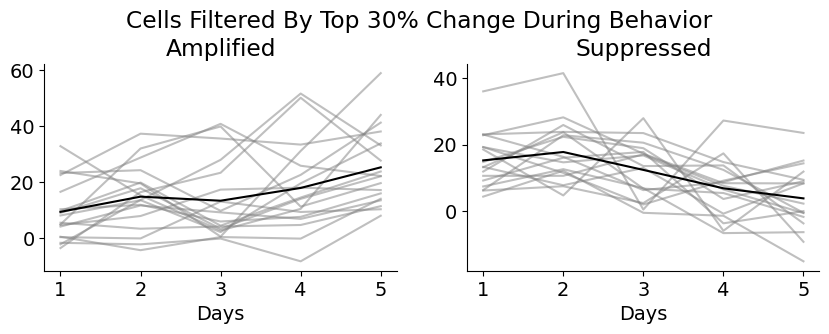

In [676]:
fig, axes = plt.subplots(1, 2, figsize=(10,3))
ax = axes.ravel()

cell_type = 'trained'
groups = ['high','low']
titles = ["Amplified", "Suppressed"]
for i, ax in enumerate(axes):
    
    # Amp and Suppressed During Behavior
    group = groups[i]
    
    # Plot highest responders 
    ax.plot(index_df.at[cell_type,'across_days'][:,index_df.at[cell_type,group]],color='grey',alpha=0.5)
    ax.plot(index_df.at[cell_type,'across_days'][:,index_df.at[cell_type,group]].mean(axis=1),color='black',lw=1.5)
    ax.set_xticks([0,1,2,3,4])
    ax.set_xticklabels([1,2,3,4,5])
    ax.set_xlabel("Days")
    ax.spines[['right', 'top']].set_visible(False)
    ax.set_title(titles[i])
    plt.rcParams.update({'font.size': 14})

    
fig.subplots_adjust(top=0.80)
val = p_threshold*100
fig.suptitle("Cells Filtered By Top %i%% Change During Behavior" % val) 

In [677]:
## What is the tuning of the cells with the largest changes during behavior? 
# Calculating for trained and untrained cells 

# Iterates through trained and untrained cell_classes 
for cell_class in index_df.index:
    # Group is high or low indices (most amplified and most suppressed over behavior)
    for group in ['high','low']:
        
        query = index_df.at[cell_class,group]
        data = dfof_cells_all.at[cell_class,'pre']
        
        if query.size == 1:
            axis = 0 
        else:
            axis = 1 
            
        maxes = np.max(data[query,:],axis=axis)
        max_locs = np.argmax(data[query,:],axis=axis)

        # Pulling the cell index of the maximum value for each orientation (associates cells with their preferred ori)
        preferred_ori_inds = [np.where(max_locs == ori_dir) for ori_dir in range(6)]

        # Pulling the maximum values in the same way
        #max_cells = [maxes[preferred_ori_inds[ori_dir]] for ori_dir in range(6)]

        # Create a dictionary for easy query
        oris = [0, 30, 60, 90, 120, 150]
        
        dict_str = group+'_dict'
        index_df.at[cell_class,dict_str] = dict(zip(oris,preferred_ori_inds))
        
        num_cells = [len(preferred_ori_inds[ori][0]) for ori in range(6)]    
        index_df.at[cell_class,group+'_num'] = dict(zip(oris,num_cells))


In [679]:
## What is the tuning of the cells

# Finding the orientation with the highest response for each cell (preferred tuning)
maxes = np.max(dfof_cells_all.at['trained','pre'],axis=1)
max_locs = np.argmax(dfof_cells_all.at['trained','pre'],axis=1)

# Pulling the cell index of the maximum value for each orientation (associates cells with their preferred ori)
preferred_ori_inds = [np.where(max_locs == ori_dir) for ori_dir in range(6)]

# Pulling the maximum values in the same way
max_cells = [maxes[preferred_ori_inds[ori_dir]] for ori_dir in range(6)]

# Create a dictionary for easy query
oris = [0, 30, 60, 90, 120, 150]
ori_dict = dict(zip(oris,preferred_ori_inds))
ori_dict
    
num_cells = [len(preferred_ori_inds[ori][0]) for ori in range(6)]    
index_df.at[cell_class,group+'_num'] = dict(zip(oris,num_cells))


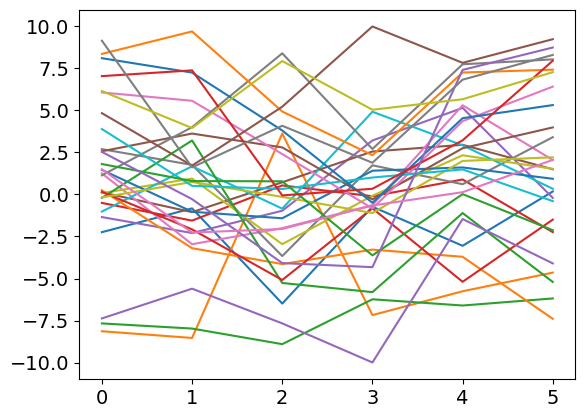

In [680]:
# Plot behavior response of cells that stayed quiet
data = dfof_cells_all.at['trained','pre'][stay_quiet_cells,:]
for cell in range(data.shape[0]):
    plt.plot(data[cell,:])

Text(0.5, 1.0, 'Max Tuning of Cells: Stay-Quiet Cells Removed (10% thresh) ')

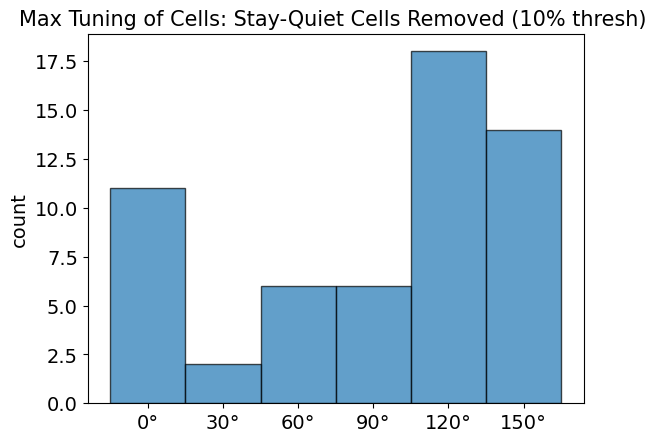

In [681]:
# Define bins and labels
bins = [0, 1, 2, 3, 4, 5, 6]  # Including upper limit for proper binning
labels = ['0°', '30°', '60°', '90°', '120°', '150°']
plt.hist(max_locs, bins=bins, edgecolor='black', alpha=0.7)
plt.xticks(ticks=np.arange(0.5, 6, 1), labels=labels)  # Centering labels
plt.ylabel("count")
plt.title("Max Tuning of Cells: Stay-Quiet Cells Removed (10% thresh) ",fontsize=15)

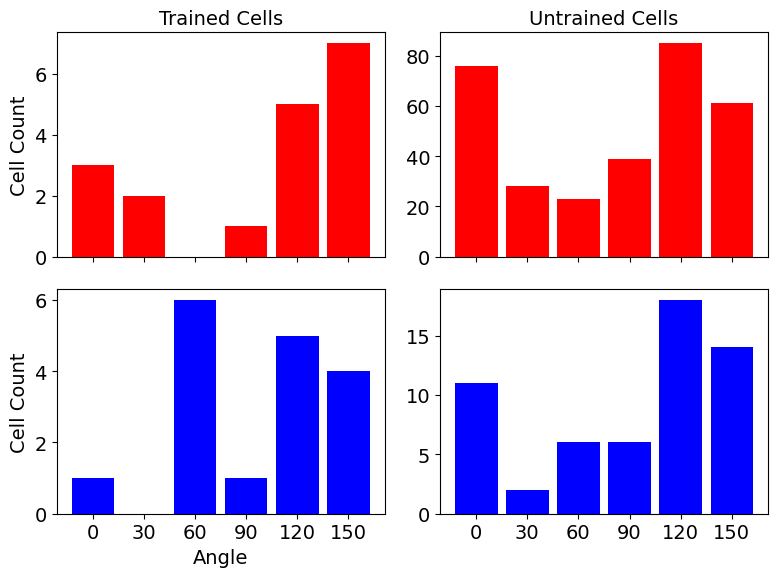

In [682]:
# Plotting histograms of tuning for cells with the largest tuning 
trained_high = index_df.at['trained','high_num']
trained_low = index_df.at['trained','low_num']
untrained_high = index_df.at['untrained','high_num']
untrained_low = index_df.at['untrained','low_num']

fig, axes = plt.subplots(2,2, figsize=(8,6), sharex =True)
width=25
# Plot histograms using dictionary values
one = axes[0, 0].bar(trained_high.keys(), trained_high.values(), width, color='red',label="Amp. During Behav.")
axes[0, 1].bar(untrained_high.keys(), untrained_high.values(), width, color='red')
two = axes[1, 0].bar(trained_low.keys(), trained_low.values(), width, color='blue',label="Sup. During Behav.")
axes[1, 1].bar(untrained_low.keys(), untrained_low.values(), width, color='blue')
axes[1,0].set_xlabel("Angle"); axes[1,0].set_xticks([0, 30, 60, 90, 120, 150])
    
# Set row labels
axes[0, 0].set_ylabel("Cell Count", fontsize=14)
axes[1, 0].set_ylabel("Cell Count", fontsize=14)

# Set column labels
axes[0, 0].set_title("Trained Cells", fontsize=14)
axes[0, 1].set_title("Untrained Cells", fontsize=14)
plt.rcParams.update({'font.size': 14})

plt.tight_layout()
plt.show()

In [152]:
index_df.at['trained','across_days'].shape

(5, 57)

/var/folders/jz/44sr7v096p1d9w_7_z1267br0000gs/T/ipykernel_13390/708969228.py:32: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  axes[1].set_title("Amplification @ Unrewarded Oris", fontsize =14); axes[1].set_xlim(-5,40)


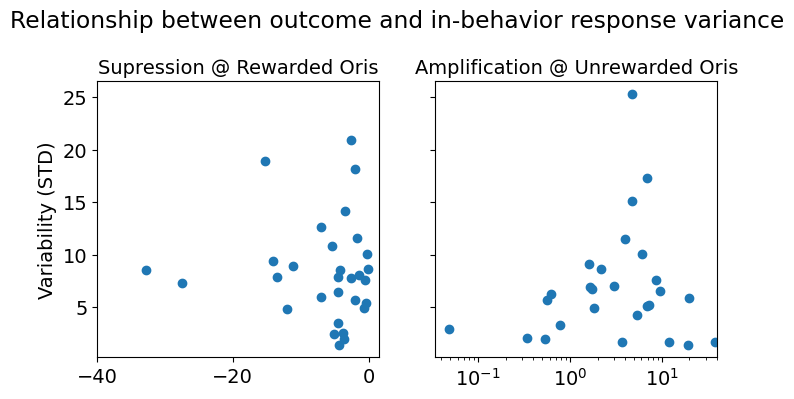

In [186]:
# Plotting a cell's in-behavior variability versus its outcome

# Angle indicies for the averages 
# as a reminder: oris = [0, 30, 60, 90, 120, 150]

rewarded_inds = [2,3,4]
unrewarded_inds = [0,1,5]

# Compute standard deviation as a measure of variability
index_df['Variability'] = index_df['across_days'].apply(lambda x: np.std(x, axis=0))

# Compute the rewarded ori suppression and unrewarded ori amplification, plot variability against this
post_pre_dif_all = dfof_cells_all.at['trained','post']-dfof_cells_all.at['trained','pre']

# Finding indices where rewarded inds were supressed and unrewarded amplified
sup = post_pre_dif_all[:,rewarded_inds].mean(axis=1)
sup_inds = np.where(sup < 0)
amp = post_pre_dif_all[:,unrewarded_inds].mean(axis=1)
amp_inds = np.where(amp > 0)

# Creating plot
fig, axes = plt.subplots(1,2, figsize=(8,4), sharey= True)
fig.subplots_adjust(top=0.8)

axes[0].scatter(sup[sup_inds], index_df.at['trained','Variability'][sup_inds])
axes[1].scatter(amp[amp_inds], index_df.at['trained','Variability'][amp_inds])
axes[1].set_xscale('log')
#axes[1].set_yscale('log')


axes[0].set_ylabel("Variability (STD)"); axes[0].set_title("Supression @ Rewarded Oris", fontsize=14); axes[0].set_xlim(left=-40)
axes[1].set_title("Amplification @ Unrewarded Oris", fontsize =14); axes[1].set_xlim(-5,40)
fig.suptitle("Relationship between outcome and in-behavior response variance")
plt.show()

In [148]:
index_df

,high,low,across_days,high_dict,low_dict,high_num,low_num,Variability
trained,"[52, 26, 15, 48, 54, 6, 10, 47, 55, 21, 45, 39]","[23, 7, 3, 1, 11, 8, 17, 2, 51, 19, 35]","[[9.780300059444267, 6.199472682587558, 23.052...","{0: ([2, 9, 11],), 30: ([1],), 60: ([],), 90: ...","{0: ([],), 30: ([],), 60: ([3, 4, 5, 7, 8, 10]...","{0: 3, 30: 1, 60: 0, 90: 1, 120: 3, 150: 4}","{0: 0, 30: 0, 60: 6, 90: 1, 120: 4, 150: 0}","[3.660393636291282, 8.584335839819596, 5.81929..."
untrained,"[707, 724, 68, 931, 268, 740, 434, 412, 499, 6...","[40, 167, 15, 1, 326, 11, 224, 0, 289, 520, 10...","[[0.847973713177512, 17.313821818598065, 0.404...","{0: ([4, 5, 7, 17, 20, 26, 41, 45, 50, 52, 57,...","{0: ([1, 6, 8, 12, 13, 21, 26, 27, 29, 30, 31,...","{0: 48, 30: 25, 60: 15, 90: 24, 120: 58, 150: 38}","{0: 36, 30: 13, 60: 33, 90: 37, 120: 67, 150: 21}","[7.070795967451971, 9.296783543474117, 5.09900..."


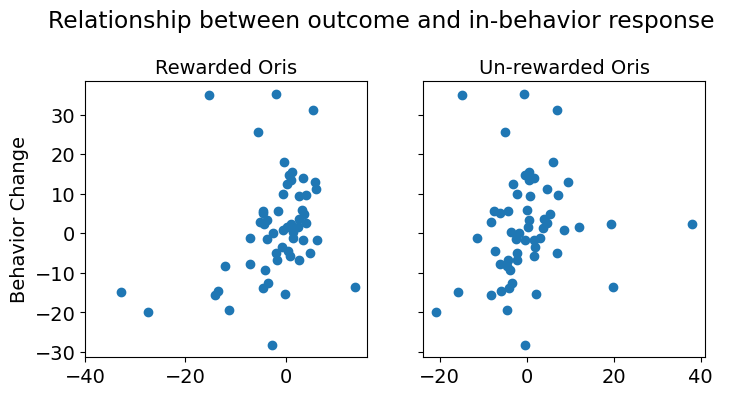

In [683]:
# Plotting a cell's in-behavior response versus its outcome 

# Angle indicies for the averages 
# as a reminder: oris = [0, 30, 60, 90, 120, 150]

rewarded_inds = [2,3,4]
unrewarded_inds = [0,1,5]

# Compute standard deviation as a measure of variability
index_df['Variability'] = index_df['across_days'].apply(lambda x: np.std(x, axis=0))

# Compute the rewarded ori suppression and unrewarded ori amplification, plot variability against this
post_pre_dif_all = dfof_cells_all.at['trained','post']-dfof_cells_all.at['trained','pre']

# Finding indices where rewarded inds were supressed and unrewarded amplified (could be the same cells)
rewarded = post_pre_dif_all[:,rewarded_inds].mean(axis=1)
sup_inds = np.where(sup < 0)
unrewarded = post_pre_dif_all[:,unrewarded_inds].mean(axis=1)
amp_inds = np.where(amp > 0)

# Creating plot
fig, axes = plt.subplots(1,2, figsize=(8,4), sharey= True)
fig.subplots_adjust(top=0.80)

# Diff between first and last day
behav_diff = index_df.at['trained','across_days'][-1,:]-index_df.at['trained','across_days'][0,:]


axes[0].scatter(rewarded, behav_diff)
axes[1].scatter(unrewarded, behav_diff)
axes[0].set_ylabel("Behavior Change"); axes[0].set_title("Rewarded Oris",fontsize=14); axes[0].set_xlim(left=-40)
axes[1].set_title("Un-rewarded Oris", fontsize=14); 
fig.suptitle("Relationship between outcome and in-behavior response ")
plt.show()

In [190]:
rew_stat

PearsonRResult(statistic=0.30123997652644824, pvalue=0.022780117035905937)

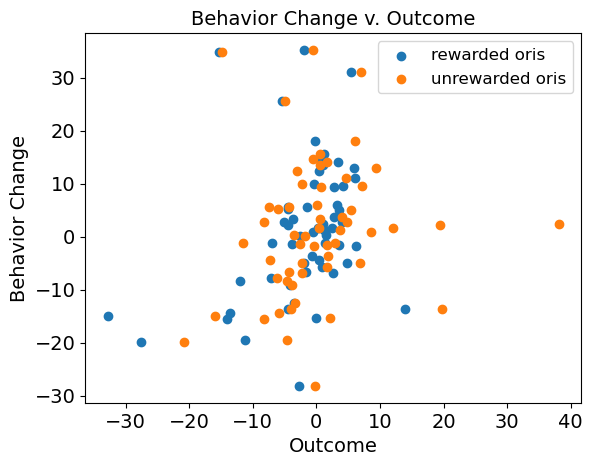

In [684]:
# Plotting a cell's in-behavior response versus its outcome 

# Angle indicies for the averages 
# as a reminder: oris = [0, 30, 60, 90, 120, 150]

rewarded_inds = [2,3,4]
unrewarded_inds = [0,1,5]

# Compute the rewarded ori suppression and unrewarded ori amplification, plot variability against this
post_pre_dif_all = dfof_cells_all.at['trained','post']-dfof_cells_all.at['trained','pre']

# Finding indices where rewarded inds were supressed and unrewarded amplified (could be the same cells)
rewarded = post_pre_dif_all[:,rewarded_inds].mean(axis=1)
sup_inds = np.where(sup < 0)
unrewarded = post_pre_dif_all[:,unrewarded_inds].mean(axis=1)
amp_inds = np.where(amp > 0)

# Creating plot

# Diff between first and last day
behav_diff = index_df.at['trained','across_days'][-1,:]-index_df.at['trained','across_days'][0,:]

# Plots 
rewarded_plt = plt.scatter(rewarded, behav_diff,label = "rewarded oris")
unrewarded_plt = plt.scatter(unrewarded, behav_diff, label = "unrewarded oris")

# Stats
rew_stat = stats.pearsonr(rewarded, behav_diff)
unrew_stat = stats.pearsonr(unrewarded, behav_diff)

plt.legend(["rewarded oris","unrewarded oris"], fontsize=12)
plt.title("Behavior Change v. Outcome", fontsize=14);
plt.xlabel("Outcome")
plt.ylabel("Behavior Change")
#plt.spines[['right','top']].set_visible(False)
plt.show()

In [475]:
post_pre_dif_all.shape

(57, 6)

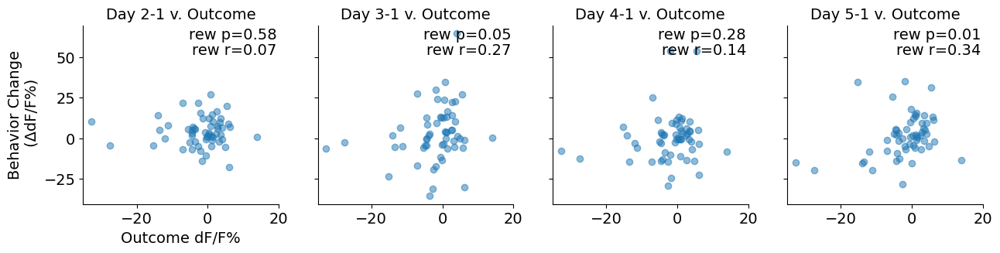

In [685]:
# Plotting a cell's in-behavior response (DIFFERENT DAYS) versus its outcome 

# Angle indicies for the averages 
# as a reminder: oris = [0, 30, 60, 90, 120, 150]

rewarded_inds = [2,3,4]
unrewarded_inds = [0,1,5]

# Compute standard deviation as a measure of variability
index_df['Variability'] = index_df['across_days'].apply(lambda x: np.std(x, axis=0))

# Compute the rewarded ori suppression and unrewarded ori amplification, plot variability against this
post_pre_dif_all = dfof_cells_all.at['trained','post']-dfof_cells_all.at['trained','pre']

# Finding indices where rewarded inds were supressed and unrewarded amplified (could be the same cells)
rewarded = post_pre_dif_all[:,rewarded_inds].mean(axis=1)
sup_inds = np.where(sup < 0)
unrewarded = post_pre_dif_all[:,unrewarded_inds].mean(axis=1)
amp_inds = np.where(amp > 0)

# Creating plot

fig, axes = plt.subplots(1,4, figsize=(15,3), sharey= True, sharex=True)

for day in range(4):

    # Diff between first and last day
    behav_diff = index_df.at['trained','across_days'][day+1,:]-index_df.at['trained','across_days'][0,:]

    # Stats
    rew_stat = stats.spearmanr(rewarded, behav_diff)
    unrew_stat = stats.spearmanr(unrewarded, behav_diff)

    rewarded_plt = axes[day].scatter(rewarded, behav_diff,label = "rewarded oris",alpha = 0.5)
    #unrewarded_plt = axes[day].scatter(unrewarded, behav_diff, label = "unrewarded oris",alpha = 0.5)
    day_next = day+2
    axes[day].set_title("Day %i-%i v. Outcome" % (day_next, 1), fontsize=14);
    axes[day].text(.99,0.99,"rew p=%.2f" %rew_stat.pvalue,ha='right', va='top', transform=axes[day].transAxes)
    #axes[day].text(.99,0.90,"unrew p=%.2f" %unrew_stat.pvalue, ha='right', va='top', transform=axes[day].transAxes)
    axes[0].set_xlabel("Outcome dF/F%")
    axes[0].set_ylabel("Behavior Change\n (ΔdF/F%)")
    #axes[day].set_ylim(-40,40)
    
    axes[day].text(.99,0.9,"rew r=%.2f" %rew_stat.statistic, ha='right', va='top', transform=axes[day].transAxes)
    #axes[day].text(.99,0.71,"unrew r=%.2f" %unrew_stat.statistic, ha='right', va='top', transform=axes[day].transAxes)

    # if day > 0:
    #     axes[day].set_yticks([])

    #axes[day].show()
    axes[day].spines[['right','top']].set_visible(False)
    axes[day].set_xticks([-20,0,20])



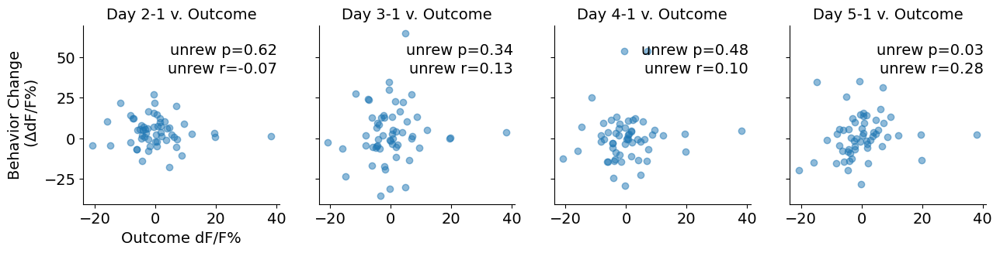

In [686]:
# Plotting a cell's in-behavior response (DIFFERENT DAYS) versus its outcome 

# Angle indicies for the averages 
# as a reminder: oris = [0, 30, 60, 90, 120, 150]

rewarded_inds = [2,3,4]
unrewarded_inds = [0,1,5]

# Compute standard deviation as a measure of variability
index_df['Variability'] = index_df['across_days'].apply(lambda x: np.std(x, axis=0))

# Compute the rewarded ori suppression and unrewarded ori amplification, plot variability against this
post_pre_dif_all = dfof_cells_all.at['trained','post']-dfof_cells_all.at['trained','pre']

# Finding indices where rewarded inds were supressed and unrewarded amplified (could be the same cells)
rewarded = post_pre_dif_all[:,rewarded_inds].mean(axis=1)
sup_inds = np.where(sup < 0)
unrewarded = post_pre_dif_all[:,unrewarded_inds].mean(axis=1)
amp_inds = np.where(amp > 0)

# Creating plot

fig, axes = plt.subplots(1,4, figsize=(15,3), sharey= True)

for day in range(4):

    # Diff between first and last day
    behav_diff = index_df.at['trained','across_days'][day+1,:]-index_df.at['trained','across_days'][0,:]

    # Stats
    rew_stat = stats.spearmanr(rewarded, behav_diff)
    unrew_stat = stats.spearmanr(unrewarded, behav_diff)

    #rewarded_plt = axes[day].scatter(rewarded, behav_diff,label = "rewarded oris",alpha = 0.5)
    unrewarded_plt = axes[day].scatter(unrewarded, behav_diff, label = "unrewarded oris",alpha = 0.5)
    day_next = day+2
    axes[day].set_title("Day %i-%i v. Outcome" % (day_next, 1), fontsize=14);
    #axes[day].text(.99,0.99,"rew p=%.2f" %rew_stat.pvalue,ha='right', va='top', transform=axes[day].transAxes)
    axes[day].text(.99,0.90,"unrew p=%.2f" %unrew_stat.pvalue, ha='right', va='top', transform=axes[day].transAxes)
    axes[0].set_xlabel("Outcome dF/F%")
    axes[0].set_ylabel("Behavior Change\n (ΔdF/F%)")
    #axes[day].set_ylim(-40,40)
    
    #axes[day].text(.99,0.9,"rew r=%.2f" %rew_stat.statistic, ha='right', va='top', transform=axes[day].transAxes)
    axes[day].text(.99,0.80,"unrew r=%.2f" %unrew_stat.statistic, ha='right', va='top', transform=axes[day].transAxes)

    # if day > 0:
    #     axes[day].set_yticks([])

    #axes[day].show()
    axes[day].spines[['right','top']].set_visible(False)
    #axes[day].set_xticks([-30,0,30])



## Creating von-mises fits to trial data from ftrace

In [20]:
import compareQuiet as cQ
file_path_root = '/Users/phillipscm/data-local/'


dir_i5214 = os.path.join(file_path_root,'i5214')
dir_pre_i5214 = os.path.join(dir_i5214,'npys-pre/')
dir_post_i5214 = os.path.join(dir_i5214,'npys-post/')

dir_i5309 = os.path.join(file_path_root,'i5309')
dir_pre_i5309 = os.path.join(dir_i5309,'npys-pre/')
dir_post_i5309 = os.path.join(dir_i5309,'npys-post/')

dir_i5398 = os.path.join(file_path_root,'i5398')
dir_pre_i5398 = os.path.join(dir_i5398,'npys-pre/')
dir_post_i5398 = os.path.join(dir_i5398,'npys-post/')


# pre_arrs_i5273 = cQ.load_npys(os.path.join(dir_pre_i5273))
# post_arrs_i5273 = cQ.load_npys(os.path.join(dir_post_i5273))

pre_arrs_i5214 = cQ.load_npys(os.path.join(dir_pre_i5214))
post_arrs_i5214 = cQ.load_npys(os.path.join(dir_post_i5214))

pre_arrs_i5309 = cQ.load_npys(os.path.join(dir_pre_i5309))
post_arrs_i5309 = cQ.load_npys(os.path.join(dir_post_i5309))

pre_arrs_i5398 = cQ.load_npys(os.path.join(dir_pre_i5398))
post_arrs_i5398 = cQ.load_npys(os.path.join(dir_post_i5398))

# dir_i5273 = os.path.join(file_path_root,'i5273')
# dir_pre_i5273 = os.path.join(dir_i5273,'npys-pre/')
# dir_post_i5273 = os.path.join(dir_i5273,'npys-post/')


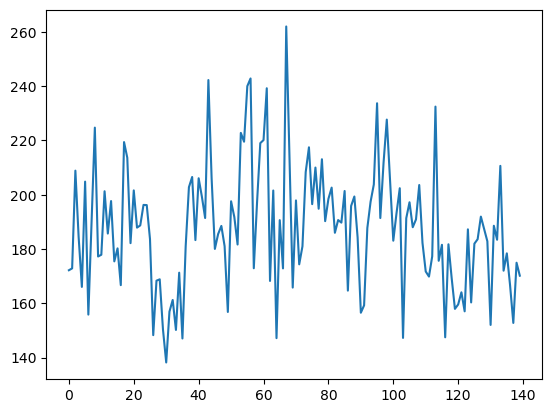

In [37]:
## Loading trial data in, then filter based on stim cell IDs, need to confirm the length of trial_ftrace is the same as

# dfof_cells_all.at['trained',col]

# Missing i5398 because less opto patterns used so can't concatenate easily 
trial_ftrace_pre_lseg = np.concatenate((pre_arrs_i5214['trial_ftrace_pre_lseg'],pre_arrs_i5309['trial_ftrace_pre_lseg']))
trial_ftrace_post_lseg = np.concatenate((post_arrs_i5214['trial_ftrace_post_lseg'],post_arrs_i5309['trial_ftrace_post_lseg']))

pre_arrs_i5398['trial_ftrace_pre_lseg'][:,6:11,:,:]
post_arrs_i5398['trial_ftrace_post_lseg'][:,6:11,:,:]

# Taking only vis traces & concat i5398 
vis_trace_pre = np.concatenate((trial_ftrace_pre_lseg[:,11:16,:,:],pre_arrs_i5398['trial_ftrace_pre_lseg'][:,6:11,:,:]),axis=0)
vis_trace_post = np.concatenate((trial_ftrace_post_lseg[:,11:16,:,:],post_arrs_i5398['trial_ftrace_post_lseg'][:,6:11,:,:]),axis=0)

datas = [vis_trace_pre,vis_trace_post]

plt.plot(post_arrs_i5214['trial_ftrace_post_lseg'][0,1,0,:])

exp_params = pickle.load(open(os.path.join('/Users/phillipscm/data-local/i5398/suite2p/', 'expt_params.pkl'),'rb')); #print('\npre_params)
bline = exp_params['baseline_frame_range']
visfr = exp_params['nStimFrV']
# Take each cell, section the stims we need, normalize each rep, average 
for data in datas:
    # Normalize baseline data with first half 
    baseline = np.mean(data[:,:,:,bline[0]:bline[1]],axis=(2,3)) # Averaging across baseline one per cell,
    dfof = (data[:,:,:,bline[1]:bline[1]+visfr]-baseline)/baseline*100 # dF/F calc 
    # baseline_trial_activity = np.mean(data[:,:,:,int(bline[1]/2):bline[1]],axis=3) # Averaging across baseline activity used for measure
    # baseline_trial_activity_dfof = np.divide(baseline_trial_activity,baseline)
    # baseline_activity = np.mean(baseline_trial_activity_dfof,axis=2) # Average across trials 
    
    
    
# HOW TO GET CELL IDENTITIES?

In [34]:
exp_params.keys()

dict_keys(['fps', 'zoom', 'frameSz', 'nTrial2P', 'nTrialV', 'nOrientations', 'nFrTrial', 'nFrTrial2P', 'nPreFr', 'nStimFr2P', 'nStimFrV', 'nStimFr', 'nPostFr', 'nPostFrV', 'nPostFr2P', 'baseline_frame_range', 'holoFrStarts', 'nHoloFr', 'nCell', 'holoPatterns'])

In [38]:
baseline.shape

(1095, 5)

In [ ]:
fit_response = np.ndarray((visResp_behavStim_pre.shape[0],points_in_fit))
kappa_fit = np.ndarray((visResp_behavStim_pre.shape[0]))
theta_fit = np.linspace(0, np.pi*5/6, 300)  # 0° to 180° in radians
FWHM_vm = np.ndarray((2,visResp_behavStim_pre.shape[0]))

orientations_deg = np.array([0, 30, 60, 90, 130, 150])

# Looping through pre and post to get measures for both
for i_data, data in enumerate([visResp_behavStim_pre,visResp_behavStim_post]):
    print(data.shape)
    # Iterate through each cell
    for i in range(dfoF_V_change_bhStim.shape[0]):

        # Step 1: Input your data
        responses = data[i,:]
        
        # Convert to radians
        orientations_rad = np.deg2rad(orientations_deg)

        # Step 2: Define von Mises tuning function
        def von_mises_tuning(theta, A, kappa, mu, B):
            return A * np.exp(kappa * np.cos(2 * (theta - mu))) + B

        # Step 3: Initial parameter guess: [A, kappa, mu, B]
        # A = 30
        # kappa = 1
        # mu = np.pi/2
        # B = 0
        # initial_guess = [A, kappa, mu, B]

        try:
            # Step 4: Curve fitting
            params, _ = curve_fit(von_mises_tuning, orientations_rad, responses)
            A_fit, kappa_fit[i], mu_fit, B_fit = params

            # Step 5: Plot result
            fit_response[i,:] = von_mises_tuning(theta_fit, *params)

             # Calculate the FWHM for each cell
            peak_val = fit_response[i,:].max()
            peak_ind = np.abs(fit_response[i,:] - peak_val).argmin()
            half_max = peak_val / 2

            # Calculating indices where x-values of data-points would be 
            half_ind = np.abs(fit_response[i,:] - half_max).argmin()
            FWHM_vm[i_data,i] = theta_fit[peak_ind] - theta_fit[half_ind]

        except RuntimeError:
            fit_response[i,:] = [np.nan]*points_in_fit  
            FWHM_vm[i_data,i] = np.nan


In [2]:
FWHM_vm = np.rad2deg(np.abs(FWHM_vm))

# Calculating indices where x-values of data-points would be 
indices = np.array([np.abs(np.rad2deg(theta_fit) - ori).argmin() for ori in orientations])

# Variance Accounted For (VAF) 
vaf = [(1 - np.var(visResp_behavStim_pre[cell,:] - fit_response[cell,indices])/np.var(visResp_behavStim_pre[cell,:]))*100 for cell in range(visResp_behavStim_pre.shape[0])]

# Print metrics of fitting
print("Cells fit succesfully: %i" %len(np.where(~np.isnan(vaf))[0]))
print("Average variance accounted for: %.2f%%" %np.nanmean(vaf)) 

NameError: name 'np' is not defined

### Behavior Trajectory Sorting

In [696]:
inc_thresh = 2
dec_thresh = inc_thresh
inc_crit = [len(np.where(diff_code[:,i] == '+')) > inc_thresh for i in range(diff_code.shape[1])]
inc_crit

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [688]:
# Sectioning timecourse data into three groups
# Slowly go down over behavior 
# Slowly go up 
# Up down up 

# Need to try different criteria where go-up cells are classified by 2 or 3 days of '+' and end value that is greater than the beginning value 

# Threshold for change 
thresh = 5 

# Defining data frame to store the coding for change between days
diff_code = np.zeros((index_df.at['trained','across_days'].shape[0]-1,index_df.at['trained','across_days'].shape[1])).astype('str')

for day in range(4):
    # Change between two days
    diff = index_df.at['trained','across_days'][day+1,:] - index_df.at['trained','across_days'][day,:]
    
    up = np.where(diff>thresh)
    no_change = np.where((thresh>diff) & (diff>-thresh))
    down = np.where(diff<-thresh)
    
    diff_code[day,up] = '+'
    diff_code[day,down] = '-'
    diff_code[day,no_change] = 'none'

# Storing cells which go up or don't change and cells that 
go_up = np.all(np.isin(diff_code,['+','none']),axis=0)
go_down = np.all(np.isin(diff_code,['-','none']),axis=0)

diff = index_df.at['trained','across_days'][-1,:] - index_df.at['trained','across_days'][0,:]
increased_resp = diff > 0

inc_thresh = 2
dec_thresh = inc_thresh
for i, cell in enumerate(diff_code): 
    inc_crit = len(np.where(cell == '+')) > inc_thresh
    dec_crit = len(np.where(cell == '+')) > dec_thresh

inc_crit = [len(np.where(diff_code[:,i] == '+')) > inc_thresh for i in diff_code.shape[1]]
    

go_up_filt = diff_code

# Finding cells where middle behavior day is less than the day before and after it 
data = index_df.at['trained','across_days']
dip_mid = (data[1,:] > data[2,:]) & (data[3,:] > data[2,:])
pop_mid = (data[1,:] < data[2,:]) & (data[3,:] < data[2,:])
other_cells = ~(go_up | go_down | dip_mid | pop_mid)

In [ ]:
# Transpose data so each row is a time series
data = index_df.at['trained','across_days']
data_t = data.T

# Convert to DataFrame for easier manipulation
df = pd.DataFrame(data_t)

# Apply rolling mean to smooth each time series
window_size =2  # Rolling window size
df_smooth = df.rolling(window=window_size, axis=1, min_periods=1).mean()

# Compute first difference to detect trend direction
df_diff = df_smooth.diff(axis=1)

# Classify trends based on final difference value
trend_labels = np.where(df_diff.iloc[:, -1] > 0, "Increasing", 
                        np.where(df_diff.iloc[:, -1] < 0, "Decreasing", "Stationary"))

# Add classification labels to the DataFrame
df["Trend"] = trend_labels

# Print first 10 classifications
print(df[["Trend"]].head(10))

# Plot grouped time series based on trends
plt.figure(figsize=(10, 5))

for trend, color in zip(["Increasing", "Decreasing", "Stationary"], ['g', 'r', 'b']):
    subset = df[df["Trend"] == trend].iloc[:, :-1].T  # Exclude the trend label column
    plt.plot(subset, color=color, alpha=0.3, label=trend if trend not in plt.gca().get_legend_handles_labels()[1] else "")

plt.xlabel("Time Step")
plt.ylabel("Value")
plt.title("Time Series Classification Based on Trends")
plt.legend()
plt.show()

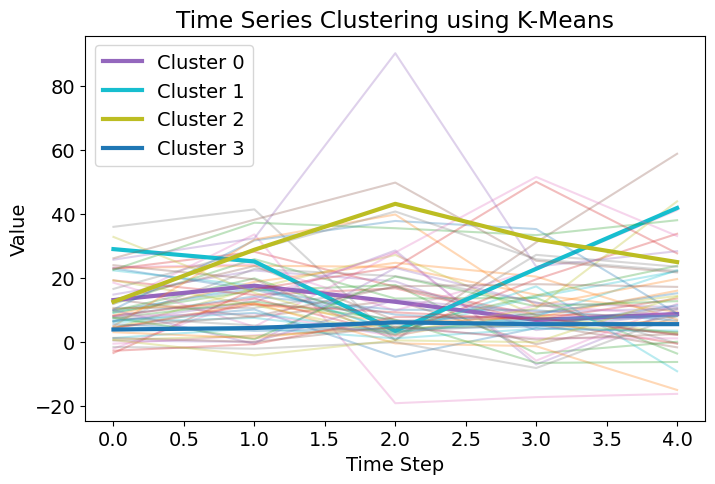

In [659]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Standardize each feature for better clustering
data_t = index_df.at['trained','across_days'].T
scaler = StandardScaler()
data_scaled = scaler.fit_transform(index_df.at['trained','across_days'].T)
n_features = 5 

# Apply K-Means clustering
num_clusters = 4  # Choose the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
labels = kmeans.fit_predict(data_scaled)

# Plot representative time series from each cluster
plt.figure(figsize=(8, 5))
for cluster in range(num_clusters):
    cluster_series = data_t[labels == cluster]  # Extract series belonging to the cluster
    for series in cluster_series:
        plt.plot(range(n_features), series, alpha=0.3)  # Plot each series in the cluster
    plt.plot(range(n_features), np.mean(cluster_series, axis=0), linewidth=3, label=f'Cluster {cluster}')

plt.xlabel("Time Step")
plt.ylabel("Value")
plt.title("Time Series Clustering using K-Means")
plt.legend()
plt.show()

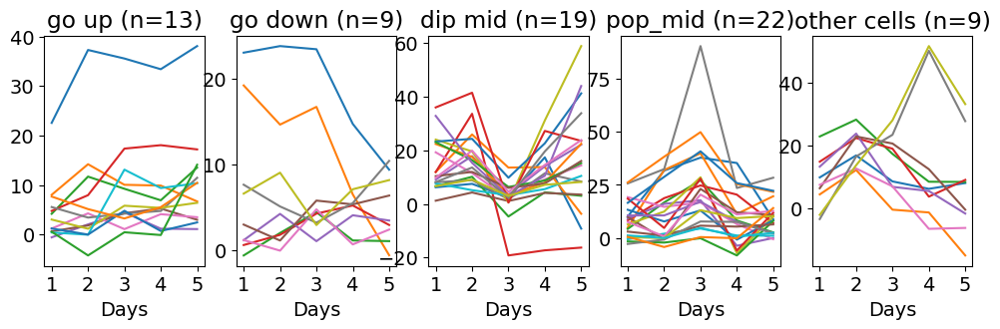

In [689]:
# Plotting groups to check catergorization
fig ,axes = plt.subplots(1,5,figsize=(12,3))
titles = ["go up","go down","dip mid","pop_mid","other cells"]
for i,inds in enumerate([go_up,go_down,dip_mid,pop_mid,other_cells]):
    ax = axes[i]
    ax.plot(index_df.at['trained','across_days'][:,inds])
    ax.set_title(titles[i] + ' (n=%i)' %len(np.where(inds)[0]))
    ax.set_xticks([0,1,2,3,4])
    ax.set_xticklabels([1,2,3,4,5])
    ax.set_xlabel("Days")


In [415]:
# Finding cells that are non-plastic during behavior
# Calculating the number of quiet cells in our data
pre_data = dfof_cells_all.at['trained','pre']
post_data = dfof_cells_all.at['trained','post']

pre_minus_post = post_data - pre_data

# Cells with <10% dfof at all angles
pre_quiet_cells = [np.all(np.abs(pre_data[row]) < 10) for row in range(pre_data.shape[0])]
post_quiet_cells = [np.all(np.abs(post_data[row]) < 10) for row in range(post_data.shape[0])]

# Cells that never acquired a tuning 
stay_quiet_cells = np.logical_and(pre_quiet_cells,post_quiet_cells)

# Finding cells that didn't change
no_change_cells = [np.all(np.abs(pre_minus_post[row]) < 10) for row in range(pre_minus_post.shape[0])]

# Not quiet, didn't change
non_plastic_cells = np.where((no_change_cells) & (~stay_quiet_cells))[0]

print("Number of non-plastic cells: %i" % len([i for i, x in enumerate(non_plastic_cells) if x]))

Number of non-plastic cells: 6


([<matplotlib.patches.Wedge at 0x136b03df0>,
 [Text(-0.06167746258165047, 1.0982694981695018, 'quiet'),
  Text(-0.9910657786312885, -0.4772720633202386, 'non-plastic'),
  Text(0.4209517280266836, -1.0162675054685892, 'plastic')],
 [Text(-0.03364225231726389, 0.5990560899106373, '51.8%'),
  Text(-0.5405813337988846, -0.2603302163564937, '10.7%'),
  Text(0.22961003346910014, -0.554327730255594, '37.5%')])

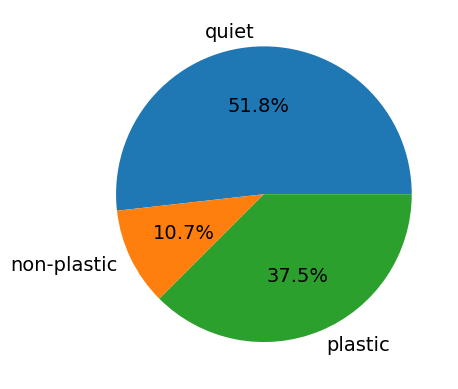

In [432]:
# Pie chart of quiet, non-plastic, and plastic cells
num_quiet = len(np.where(stay_quiet_cells)[0])
num_nonp = len(np.where(non_plastic_cells)[0])

# Calculating number of cells that were plastic 
num_change = len(stay_quiet_cells) - num_no_change - num_nonp
w
labels = 'quiet','non-plastic','plastic'
sizes = [num_quiet, num_nonp, num_change]

fig, ax = plt.subplots()
ax.pie(sizes, labels=labels,autopct='%1.1f%%')

### plot cells and pixels in same fig example

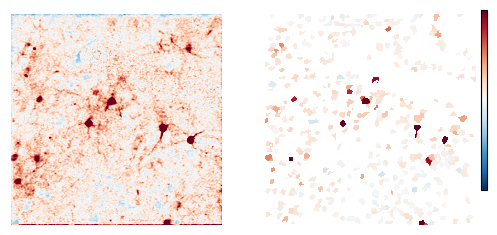

In [37]:
#plt.figure(figsize=r_[1,0.3]*5)#; cl = 20; #example plot
fig, ax = plt.subplots(1,2,figsize=r_[1,0.6]*6, dpi=100);
im = ax[0].imshow(dfof_V_post,clim=(-cl,cl),cmap='RdBu_r') # @ connor no local contrast adaptation
ax[0].axis('off')
im2 = ax[1].imshow(df_dfof_cellmap.iloc[0, 0],clim=(-cl,cl),cmap='RdBu_r');ax[1].axis('off')
cbar_ax = fig.add_axes([0.91, 0.3, 0.01, 0.5]); fig.colorbar(im,cax=cbar_ax)
plt.gca().tick_params(axis=u'both', which=u'both',length=0); xtick = plt.xticks([]); ytick = plt.yticks([]) #no ticks

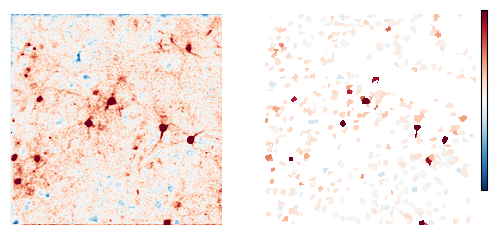

In [38]:
#plt.figure(figsize=r_[1,0.3]*5)#; cl = 20; #example plot
fig, ax = plt.subplots(1,2,figsize=r_[1,0.6]*6, dpi=100);
im = ax[0].imshow(dfof_V_post_smooth,clim=(-cl,cl),cmap='RdBu_r') # @ connor YES local contrast adaptation
ax[0].axis('off')
im2 = ax[1].imshow(df_dfof_cellmap.iloc[0, 0],clim=(-cl,cl),cmap='RdBu_r');ax[1].axis('off')
cbar_ax = fig.add_axes([0.91, 0.3, 0.01, 0.5]); fig.colorbar(im,cax=cbar_ax)
plt.gca().tick_params(axis=u'both', which=u'both',length=0); xtick = plt.xticks([]); ytick = plt.yticks([]) #no ticks

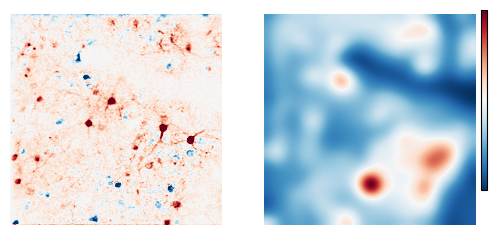

In [39]:
#plt.figure(figsize=r_[1,0.3]*5)#; cl = 20; #example plot
fig, ax = plt.subplots(1,2,figsize=r_[1,0.6]*6, dpi=100);
im = ax[0].imshow(df_V_post[3,:],clim=(-cl,cl),cmap='RdBu_r') # @ connor YES local contrast adaptation
ax[0].axis('off')
im2 = ax[1].imshow(gaussian_filter(bl_V_post.mean(axis=0),sigma=10),cmap='RdBu_r');ax[1].axis('off')
cbar_ax = fig.add_axes([0.91, 0.3, 0.01, 0.5]); fig.colorbar(im,cax=cbar_ax)
plt.gca().tick_params(axis=u'both', which=u'both',length=0); xtick = plt.xticks([]); ytick = plt.yticks([]) #no ticks